# Анализ рынка заведений общественного питания Москвы

В нашем распоряжении имеется датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

Цель работы - подготовить исследование рынка Москвы.

Задачи работы - найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

План работы:
1. Подготовить данные для анализа
2. Выполнить предобработку данных
3. Провести анализ данных
4. Дать рекомендации для открытия кофейни

###  Изучение общей информации

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import json
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [2]:
path = '/datasets/'
df = pd.read_csv(path + 'moscow_places.csv')

In [3]:
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
df.duplicated().sum()

0

In [6]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В датасете имеется 8406 записей без явных дубликатов. Пропусков нет в стлбцах:

- название заведения;
- категория заведения;
- адрес заведения;
- административный район, в котором находится заведение;
- широта географической точки, в которой находится заведение;
- долгота географической точки, в которой находится заведение;
- рейтинг заведения по оценкам пользователей в Яндекс Картах;
- число, выраженное 0 или 1, которое показывает, является ли заведение сетевым.

С пропусками в следующих столбцах имеются пропуски, проверим их характер далее:

- информация о днях и часах работы;
- категория цен в заведении;
-  строка, которая хранит среднюю стоимость заказа в виде диапазона;
- число с оценкой среднего чека, которое указано только для значений из столбца avg_bill;
- число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill;
- количество посадочных мест.

На первый взгяд тип данных у каждого столбца соответствует.

In [7]:
duplicateRows = df[df.duplicated(['address', 'name'])]

<div class="alert alert-info"> <b> Выдвинул предположение что могут быть дубликаты по столбцам названия заведения и его адрес с разными остальными данными, но дубликатов в этих столбцах не обнаружено 

In [8]:
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()

In [9]:
print(df.duplicated().sum()) 

0


###  Предобработка данных

In [10]:
df['name'].value_counts()

кафе                189
шоколадница         120
домино'с пицца       77
додо пицца           74
one price coffee     72
                   ... 
хинкальная кинза      1
de village            1
relax lounge          1
кафе натахтари        1
чайхана. uz           1
Name: name, Length: 5512, dtype: int64

In [11]:
df['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [12]:
df['address'].value_counts() 

москва, проспект вернадского, 86в               28
москва, усачёва улица, 26                       26
москва, площадь киевского вокзала, 2            20
москва, ярцевская улица, 19                     20
москва, щёлковское шоссе, вл75                  16
                                                ..
москва, рождественский бульвар, 20               1
москва, нахимовский проспект, 24с1               1
москва, красноярская улица, 2                    1
москва, ильменский проезд, 10, стр. 2а           1
москва, улица академика королёва, 4, корп. 2     1
Name: address, Length: 5752, dtype: int64

In [13]:
df['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [14]:
df['hours'].value_counts()

ежедневно, 10:00–22:00                                  759
ежедневно, круглосуточно                                730
ежедневно, 11:00–23:00                                  396
ежедневно, 10:00–23:00                                  310
ежедневно, 12:00–00:00                                  254
                                                       ... 
вт-вс 10:45–21:00                                         1
пн-пт 17:00–00:00; сб,вс 12:00–00:00                      1
пн-пт 09:00–17:00; сб 09:00–16:00                         1
пн-чт 12:00–21:00; пт-вс 13:00–22:00                      1
пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 11:00–22:00      1
Name: hours, Length: 1307, dtype: int64

In [15]:
df['lat'].describe()

count    8406.000000
mean       55.750109
std         0.069658
min        55.573942
25%        55.705155
50%        55.753425
75%        55.795041
max        55.928943
Name: lat, dtype: float64

In [16]:
df['lng'].describe()

count    8406.000000
mean       37.608570
std         0.098597
min        37.355651
25%        37.538583
50%        37.605246
75%        37.664792
max        37.874466
Name: lng, dtype: float64

In [17]:
df['rating'].value_counts()

4.3    1513
4.4    1351
4.2    1041
4.1     785
4.5     623
4.0     499
4.7     440
4.6     422
3.9     252
4.9     243
4.8     215
3.8     188
3.7     147
5.0     105
3.6      76
3.5      72
3.4      68
3.3      54
3.2      41
3.1      37
2.9      31
2.8      30
3.0      24
2.6      15
1.1      14
2.5      14
2.3      14
2.2      13
2.4      11
2.7      11
1.3      11
1.4      11
1.0      10
1.7       6
2.1       4
2.0       4
1.9       4
1.6       2
1.8       2
1.5       2
1.2       1
Name: rating, dtype: int64

In [18]:
df['price'].value_counts()

средние          2117
выше среднего     564
высокие           478
низкие            156
Name: price, dtype: int64

In [19]:
df['avg_bill'].value_counts()

Средний счёт:1000–1500 ₽    241
Средний счёт:1500–2000 ₽    120
Средний счёт:300–500 ₽       90
Средний счёт:500–1000 ₽      78
Средний счёт:1500–2500 ₽     68
                           ... 
Средний счёт:355 ₽            1
Средний счёт:310–370 ₽        1
Средний счёт:382 ₽            1
Средний счёт:140–250 ₽        1
Средний счёт:520–1200 ₽       1
Name: avg_bill, Length: 897, dtype: int64

In [20]:
df['middle_avg_bill'].value_counts()

1250.0    247
1000.0    175
300.0     148
1500.0    146
400.0     134
         ... 
545.0       1
6000.0      1
345.0       1
1060.0      1
30.0        1
Name: middle_avg_bill, Length: 230, dtype: int64

In [21]:
df['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

In [22]:
df['middle_coffee_cup'].value_counts()

256.0    43
60.0     33
95.0     32
150.0    24
170.0    18
         ..
320.0     1
227.0     1
137.0     1
172.0     1
259.0     1
Name: middle_coffee_cup, Length: 96, dtype: int64

In [23]:
df['middle_coffee_cup'].describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [24]:
df['chain'].value_counts()

0    5201
1    3205
Name: chain, dtype: int64

In [25]:
df['seats'].value_counts()

40.0     253
100.0    213
60.0     175
50.0     168
80.0     160
        ... 
600.0      1
268.0      1
61.0       1
236.0      1
33.0       1
Name: seats, Length: 229, dtype: int64

In [26]:
df['street'] = df['address'].str.split(', ').str[1]

In [27]:
df['street'].value_counts()

проспект мира               184
профсоюзная улица           122
проспект вернадского        108
ленинский проспект          107
ленинградский проспект       95
                           ... 
переведеновский переулок      1
москворецкая набережная       1
старокаширское шоссе          1
крылатский мост               1
улица шкулёва                 1
Name: street, Length: 1447, dtype: int64

In [28]:
df.query('street == "проспект Мира"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street


In [29]:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')

In [30]:
df['is_24/7'].value_counts()

False    7140
True      730
Name: is_24/7, dtype: int64

Имеется странность в названии заведения. Вряд ли заведение называется "Кафе", скорее всего ошибка при выгрузке данных и название записано не полностью.
Заменить чем-то пропуски вряд ли выйдет, поэтому пока будем работать с этими данными.
Были добавлены столбцы с названием улиц и с круглосуточной работой заведений

###  Анализ данных

#### Анализ категорий заведений представленых в данных

In [31]:
df_category = pd.DataFrame(df['category'].value_counts()).reset_index()
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=df_category['index'], # указываем значения, которые появятся на метках сегментов
                             values=df_category['category'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Распределение категорий заведений', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show() # выводим график

Больше всего заведений "Кафе" - 28,3%
Далее идут "Рестораны" - 24,3%
И "Кофейни" - 16,8%
Меньше всего столовых(3,8%) и булочных (3,1%)

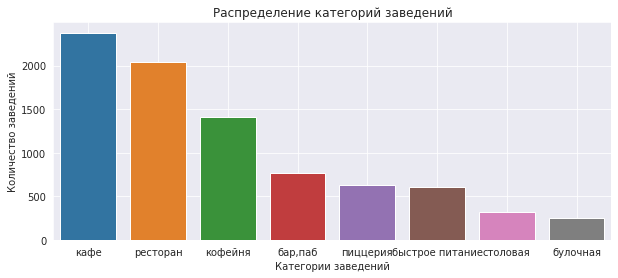

In [32]:
sns.set_style('dark')
plt.figure(figsize=(10, 4))
sns.barplot(x='index', y='category', data=df_category)
plt.title('Распределение категорий заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Количество заведений')
plt.grid()
plt.show()

#### Анализ количества посадочных мест в местах по категориям

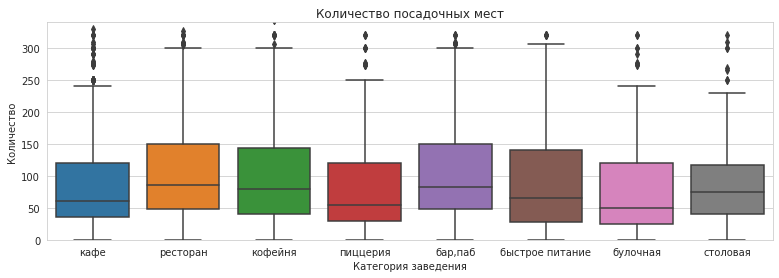

In [33]:
sns.set_style('whitegrid')
plt.figure(figsize=(13, 4))
ax = sns.boxplot(x='category', y='seats', data=df)
plt.ylim(0, 340)
plt.title('Количество посадочных мест')
plt.xlabel('Категория заведения')
plt.ylabel('Количество')
plt.show()

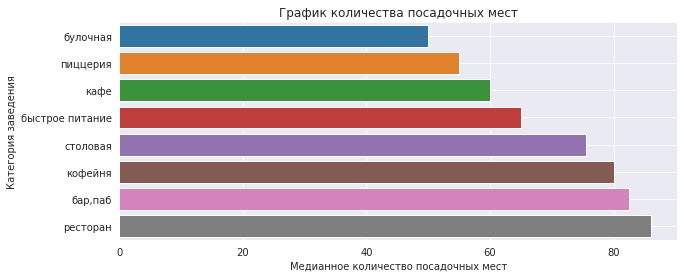

In [34]:
df_seats = df.groupby(['category'], \
                        as_index = False)[['seats']].median()
df_seats = df_seats.sort_values(by='seats')
sns.set_style('dark')
plt.figure(figsize=(10, 4))
sns.barplot(x='seats', y='category', data=df_seats)
plt.title('График количества посадочных мест')
plt.xlabel('Медианное количество посадочных мест')
plt.ylabel('Категория заведения')
plt.grid()
plt.show()

Лидеры по количеству посадочных мест:

- Рестораны
- Бары, пабы
- Кофейни

#### Соотношение сетевых и несетевых заведений в датасете

In [35]:
df_chain  = pd.DataFrame(df['chain'].value_counts()).reset_index()
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=df_chain['index'], # указываем значения, которые появятся на метках сегментов
                             values=df_chain['chain'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Соотношение сетевых и несетевых заведений', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='0 - не сетевое, 1 - сетевое',
                                    showarrow=False)],
                 )
fig.show() # выводим график

62% несетевых заведений и 38 сетевых

<div class="alert alert-success" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.1</b> 
    
👍 
Супер, именно доля заведений корректно дает ответ на поставленный вопрос. 
</div>

#### Анализ категорий заведений, которые чаще являются сетевыми

In [36]:
df_chain_f = df.query('chain==1')

df_category_chain_f = pd.DataFrame(df_chain_f['category'].value_counts()).reset_index()
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=df_category_chain_f['index'], # указываем значения, которые появятся на метках сегментов
                             values=df_category_chain_f['category'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Распределение категорий заведений', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show() # выводим график

Лидеры сетевых заведений: Кафе, Рестораны и Кофейни

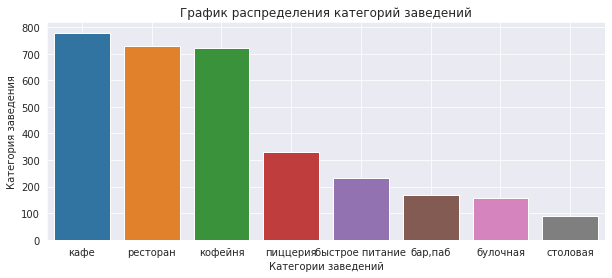

In [37]:
sns.set_style('dark')
plt.figure(figsize=(10, 4))
sns.barplot(x='index', y='category', data=df_category_chain_f)
plt.title('График распределения категорий заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Категория заведения')
plt.grid()
plt.show()

In [38]:
kat = df.groupby(['category', 'chain'], as_index=False).agg({'name':'count'}).sort_values(by='category', ascending=False)
kat

,category,chain,name
14,столовая,0,227
15,столовая,1,88
12,ресторан,0,1313
13,ресторан,1,730
10,пиццерия,0,303
11,пиццерия,1,330
8,кофейня,0,693
9,кофейня,1,720
6,кафе,0,1599
7,кафе,1,779


In [39]:
fig = px.bar(kat, x="category", y="name", color="chain", labels=dict(district="Район", name="Количество заведений"))
fig.update_layout(title='Распределение сетевых заведений', # указываем заголовок графика
                  width=1000, # указываем размеры графика
                  height=600)
fig.show()

In [40]:
#Код ревьюера
df_chain_share = df.pivot_table(index='category', columns='chain', values='name', aggfunc='count')
df_chain_share.columns = ['not_chain', 'chain']
df_chain_share['total'] = df_chain_share['not_chain'] + df_chain_share['chain']
df_chain_share['share'] = (df_chain_share['chain']/df_chain_share['total']*100).round().astype('int')
df_chain_share.sort_values(by='share', ascending=False)

,not_chain,chain,total,share
category,,,,
булочная,99,157,256,61
пиццерия,303,330,633,52
кофейня,693,720,1413,51
быстрое питание,371,232,603,38
ресторан,1313,730,2043,36
кафе,1599,779,2378,33
столовая,227,88,315,28
"бар,паб",596,169,765,22


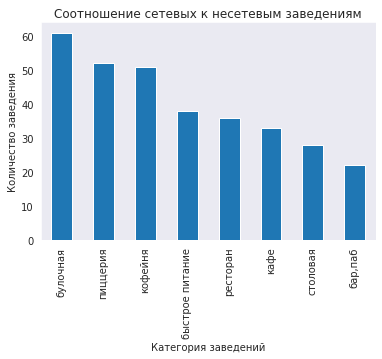

In [41]:
df_chain_share.sort_values(by='share', ascending=False)['share'].plot(kind='bar')
plt.title('Соотношение сетевых к несетевым заведениям')
plt.xlabel('Категория заведений')
plt.ylabel('Количество заведения')
plt.show()

<div class="alert alert-info"> <b> Булочных сетей больше половины заведений, пиццерий половина

#### Топ-15 популярных сетей в Москве

In [42]:
top15 = pd.DataFrame(df_chain_f['name'].value_counts().head(15))
top15

,name
шоколадница,120
домино'с пицца,76
додо пицца,74
one price coffee,71
яндекс лавка,69
cofix,65
prime,50
хинкальная,44
кофепорт,42
кулинарная лавка братьев караваевых,39


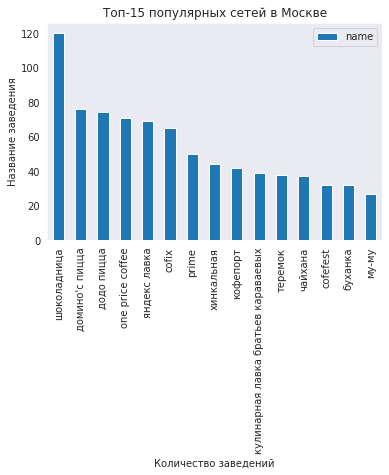

In [43]:
top15.plot(kind='bar')
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество заведений')
plt.ylabel('Название заведения')
plt.show()

Лидеры по количеству заведений: Шоколадница, Доминос Пицца, Додо пицца

In [44]:
kat_1 = pd.DataFrame(df_chain_f.groupby('name').count().sort_values(by='category', ascending=False).head(15)['category']).index
kat_2 = pd.DataFrame(df_chain_f.query('name in @kat_1').groupby('name')['category'].unique())
kat_2

,category
name,
cofefest,"[кофейня, кафе]"
cofix,[кофейня]
one price coffee,[кофейня]
prime,"[ресторан, кафе]"
буханка,"[булочная, кофейня, кафе]"
додо пицца,[пиццерия]
домино'с пицца,[пиццерия]
кофепорт,[кофейня]
кулинарная лавка братьев караваевых,[кафе]


<div class="alert alert-info"> <b> Есть проблема, в том что одни и те же заведения относятся к разным категориям, что затрудняет определение доли категорий

In [45]:
#Код ревьюера
top15_name_chain =  (df.query('chain == 1').groupby('name', as_index=False)
                              .agg(count_object=('name', 'count'))
                              .sort_values(by='count_object', ascending=False))[:15]

top15_name_chain

,name,count_object
729,шоколадница,120
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,71
742,яндекс лавка,69
58,cofix,65
168,prime,50
664,хинкальная,44
409,кофепорт,42
418,кулинарная лавка братьев караваевых,39


In [46]:
#Код ревьюера
list_top15_name = top15_name_chain['name'].unique()

top15_df = df.query('chain == 1').query('name in @list_top15_name')

top15_df.groupby(['name', 'category']).agg(count_object=('name', 'count'))

count_object
name                                category                     
cofefest                            кафе                        1
                                    кофейня                    31
cofix                               кофейня                    65
one price coffee                    кофейня                    71
prime                               кафе                        1
                                    ресторан                   49
буханка                             булочная                   25
                                    кафе                        1
                                    кофейня                     6
додо пицца                          пиццерия                   74
домино'с пицца                      пиццерия                   76
кофепорт                            кофейня                    42
кулинарная лавка братьев караваевых кафе                       39
му-му                               бар,паб                     1
                                    быстрое питание             2
                                    кафе                       12
                                    кофейня                     2
                                    пиццерия                    1
                                    ресторан                    8
                                    столовая                    1
теремок                             быстрое питание             2
                                    ресторан                   36
хинкальная                          бар,паб                     3
                                    быстрое питание             6
                                    кафе                       19
                                    ресторан                   15
                                    столовая                    1
чайхана                             быстрое питание             2
                                    кафе                       26
                                    ресторан                    9
шоколадница                         кафе                        1
                                    кофейня                   119
яндекс лавка                        ресторан                   69

In [47]:
qazzz = top15_df.groupby(['category'], as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False)
qazzz

,category,name
4,кофейня,336
6,ресторан,186
5,пиццерия,151
3,кафе,100
1,булочная,25
2,быстрое питание,12
0,"бар,паб",4
7,столовая,2


In [48]:
fig = px.bar(qazzz, x="category", y="name", color="category", labels=dict(district="Район", name="Количество заведений"))
fig.update_layout(title='Категория заведений топ 15', # указываем заголовок графика
                  width=1000, # указываем размеры графика
                  height=600)
fig.show()

In [49]:
fig = go.Figure(data=[go.Pie(labels=qazzz['category'], # указываем значения, которые появятся на метках сегментов
                             values=qazzz['name'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Распределение категорий заведений из топ 15', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show() # выводим график

<div class="alert alert-info"> <b> 41% заведений - кофейни, 23% рестораны, 19% - пиццерии

#### Анализ административных районов Москвы 

In [50]:
qaz = df.groupby(['district', 'category'], as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False)
qaz

,district,category,name
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",23
39,Северо-Западный административный округ,столовая,18
63,Юго-Западный административный округ,столовая,17
49,Юго-Восточный административный округ,булочная,13


In [51]:
fig = px.bar(qaz, x="district", y="name", color="category", labels=dict(district="Район", name="Количество заведений"))
fig.update_layout(title='Количество заведений по районам', # указываем заголовок графика
                  width=1000, # указываем размеры графика
                  height=600)
fig.show()

Лидер по количеству заведений Центральный округ в котором лидируют рестораны, Кафе и Кофейни, в остальных районах лидеры такие же, но заведений в среднем в 2 раза меньше

#### Распределение средних рейтингов по категориям заведений

In [52]:
df_rating = df.groupby(['category'], \
                        as_index = False)[['rating']].mean()
df_rating = df_rating.sort_values(by='rating')
df_rating

,category,rating
2,быстрое питание,4.050249
3,кафе,4.123886
7,столовая,4.211429
1,булочная,4.268359
4,кофейня,4.277282
6,ресторан,4.290357
5,пиццерия,4.301264
0,"бар,паб",4.387712


In [53]:
fig = px.bar(df_rating, x='category', y='rating', color='rating', title='График среднего рейтинга')
fig.update_xaxes(tickangle=45)
fig.show()

Выше средний рейтинг у баров, пабов, пиццерий и ресторанов что говорит о высокой лояльности людей в данных заведениях, ниже всего рейтинги у заведений быстрого питания

#### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [54]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [55]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

#### Изображение всех заведения датасета на карте с помощью кластеров

In [56]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

#### Топ-15 улиц по количеству заведений

In [57]:
top_15street = df.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name', ascending=False).head(15)
top_15street

,name
street,
проспект мира,184
профсоюзная улица,122
проспект вернадского,108
ленинский проспект,107
ленинградский проспект,95
дмитровское шоссе,88
каширское шоссе,77
варшавское шоссе,76
ленинградское шоссе,70


In [58]:
top_street = top_15street.index
str_gr = df.query('street in @top_street')

In [59]:
st = str_gr.groupby(['street', 'category'], as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False)
st

,street,category,name
78,проспект мира,кафе,53
63,мкад,кафе,45
81,проспект мира,ресторан,45
79,проспект мира,кофейня,36
86,профсоюзная улица,кафе,35
...,...,...,...
58,люблинская улица,пиццерия,1
68,проспект вернадского,булочная,1
66,мкад,столовая,1
23,кутузовский проспект,булочная,1


In [60]:
fig = px.bar(st, x="street", y="name", color="category", labels=dict(name="Количество", street="Улица"))
fig.update_layout(title='Топ-15 улиц по количеству заведений', # указываем заголовок графика
                  width=1000, # указываем размеры графика
                  height=600)
fig.update_layout(xaxis={'categoryorder':'total ascending'})
fig.show()

Больше всего заведений в данной категории представленны категорией Кафе

#### Улицы, на которых находится только один объект общепита

In [61]:
nontopstreet = df.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name')
nontopstreet = nontopstreet.query('name == 1')
nontopstreet

,name
street,
1-й автозаводский проезд,1
новосущёвская улица,1
новощукинская улица,1
новоясеневский тупик,1
одинцовская улица,1
...,...
верхняя улица,1
1-й голутвинский переулок,1
1-й новокузнецкий переулок,1


In [62]:
nontop_street = nontopstreet.index
nonstr_gr = df.query('street in @nontop_street')

In [63]:
df_rating_min = nonstr_gr.groupby(['category'], \
                        as_index = False)[['rating']].mean()
df_rating_min = df_rating_min.sort_values(by='rating')
df_rating_min

,category,rating
2,быстрое питание,4.082609
3,кафе,4.139623
6,ресторан,4.246237
7,столовая,4.261111
4,кофейня,4.307143
1,булочная,4.337500
5,пиццерия,4.373333
0,"бар,паб",4.479487


In [64]:
fig = px.bar(df_rating_min, x='category', y='rating', color='rating', title='График среднего рейтинга')
fig.update_xaxes(tickangle=45)
fig.show()

В целом рейтинг не отличается от среднего рейтинга всех заведений по Москве, хоть у данных заведений и нет конкурентов

#### фоновую картограмму (хороплет) со средними чеками для каждого района

In [65]:
middle_avg_bill_df = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
middle_avg_bill_df = middle_avg_bill_df.sort_values(by='middle_avg_bill')
middle_avg_bill_df

,district,middle_avg_bill
6,Юго-Восточный административный округ,450.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
0,Восточный административный округ,575.0
7,Юго-Западный административный округ,600.0
2,Северный административный округ,650.0
4,Северо-Западный административный округ,700.0
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0


In [66]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Ценовой индикатор по районам',
).add_to(m)

# выводим карту
m

Самые высокие чеки находятся у заведений в Западном административном округе и Центральном административном округе и составляет 1000 рублей

Подводя итог заметим следующее:

Больше всего заведений "Кафе" - 28,3% Далее идут "Рестораны" - 24,3% И "Кофейни" - 16,8% Меньше всего столовых(3,8%) и булочных (3,1%)
Лидеры по количеству посадочных мест:

- Рестораны
- Бары, пабы
- Кофейни.

62% всех заведений - несетевых и 38 сетевых.

Лидеры сетевых заведений: Кафе, Рестораны и Кофейни.

Лидеры по количеству заведений: Шоколадница, Доминос Пицца, Додо пицца.

Лидер по количеству заведений Центральный округ в котором лидируют рестораны, Кафе и Кофейни, в остальных районах лидеры такие же, но заведений в среднем в 2 раза меньше. 

Выше средний рейтинг у баров, пабов, пиццерий и ресторанов что говорит о высокой лояльности людей в данных заведениях, ниже всего рейтинги у заведений быстрого питания.

Больше всего заведений в данной категории представленны категорией Кафе.

В целом рейтинг не отличается от среднего рейтинга всех заведений по Москве, хоть у данных заведений и нет конкурентов.

Самые высокие чеки находятся у заведений в Западном административном округе и Центральном административном округе и составляет 1000 рублей.

###   Детализируем исследование: открытие кофейни

#### Количество кофеен в датасете

In [67]:
df_cof = df[df['category'] == 'кофейня']
df_cof.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1398 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   int64  
 13  seats              751 non-null    float64
 14  street             1413 non-null   object 
 15  is_24/7            1398 non-null   object 
dtypes: float64(6), int64(1),

In [68]:
print(df_cof['name'].count())

1413


В Москве находится кофеен 1413 

#### Анализ расположения кофеен

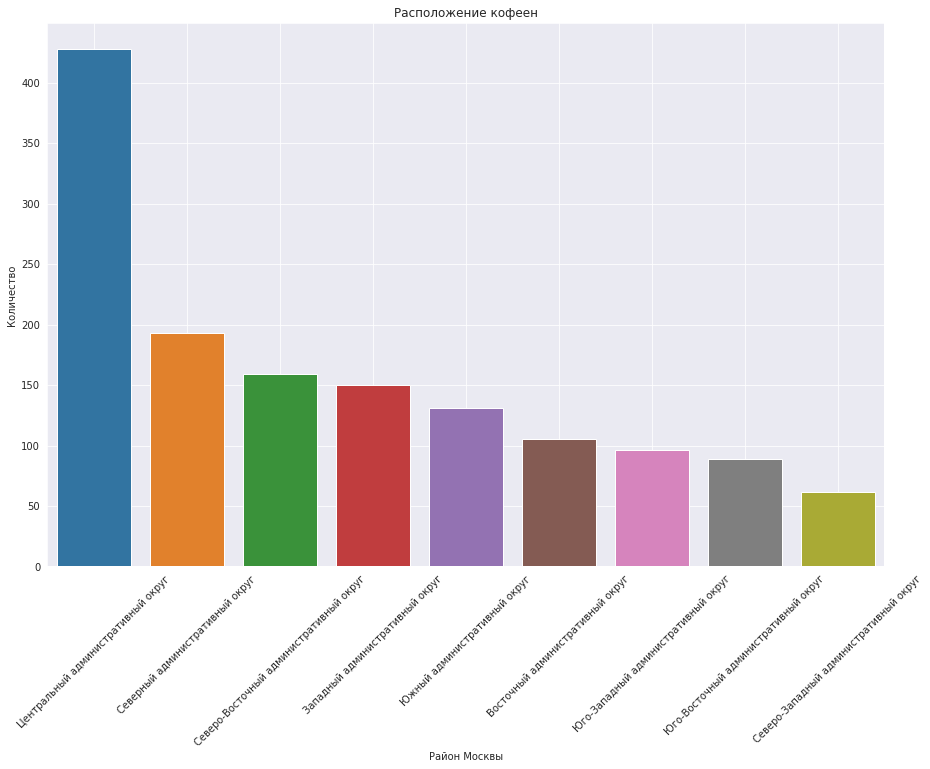

In [69]:
plt.figure(figsize=(15, 10))
sns.countplot(x='district', data=df_cof, order = df_cof['district'].value_counts().index)
plt.xticks(rotation=45)
plt.title('Расположение кофеен')
plt.xlabel('Район Москвы')
plt.ylabel('Количество')
plt.grid()
plt.show()

In [70]:
df_cof_gr = df_cof.groupby('district', as_index=False)['name'].agg('count')
df_cof_gr

,district,name
0,Восточный административный округ,105
1,Западный административный округ,150
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
4,Северо-Западный административный округ,62
5,Центральный административный округ,428
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
8,Южный административный округ,131


In [71]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=df_cof_gr,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Расположение кофеен',
).add_to(m)

# выводим карту
m

Наблюдается большая конкуренция в Северном (193), Северо-Восточном (159) и Центральном административном округе (428)

#### Наличие круглосуточных кофеен

In [72]:
print(df_cof['is_24/7'].sum())

59


In [73]:
df_cof_gr24 = df_cof.groupby('district', as_index=False)['is_24/7'].agg('sum')
df_cof_gr24

,district,is_24/7
0,Восточный административный округ,5
1,Западный административный округ,9
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
5,Центральный административный округ,26
6,Юго-Восточный административный округ,1
7,Юго-Западный административный округ,7
8,Южный административный округ,1


In [74]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=df_cof_gr24,
    columns=['district', 'is_24/7'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Расположение кофеен',
).add_to(m)

# выводим карту
m

Больше всего круглосуточных в центраьном округе, что объяснимо большой туристической проходимостью 

#### Рейтинги кофеен

In [75]:
df_rating_cof = df_cof.groupby(['district'], \
                        as_index = False)[['rating']].mean()
df_rating_cof = df_rating_cof.sort_values(by='rating')
df_rating_cof

,district,rating
1,Западный административный округ,4.195333
3,Северо-Восточный административный округ,4.216981
6,Юго-Восточный административный округ,4.225843
8,Южный административный округ,4.232824
0,Восточный административный округ,4.282857
7,Юго-Западный административный округ,4.283333
2,Северный административный округ,4.291710
4,Северо-Западный административный округ,4.325806
5,Центральный административный округ,4.336449


In [76]:
fig = px.bar(df_rating_cof, x='district', y='rating', color='rating', title='График среднего рейтинга')
fig.update_xaxes(tickangle=45)
fig.show()

В целом отличия в рейтинге по районам не значительны

#### Средняя стоимость чашки капучино

In [77]:
middle_coffee_cup_df = df_cof.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
middle_coffee_cup_df

,district,middle_coffee_cup
0,Восточный административный округ,135.0
1,Западный административный округ,189.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
4,Северо-Западный административный округ,165.0
5,Центральный административный округ,190.0
6,Юго-Восточный административный округ,147.5
7,Юго-Западный административный округ,198.0
8,Южный административный округ,150.0


In [78]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=middle_coffee_cup_df,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Ценовой индикатор по районам',
).add_to(m)

# выводим карту
m

Самыми перспективными районами для открытия кофейни с точки зрения цены кофе являются Центральный административный округ, Западный административный округ и Юго-Западный административный округ

Таким образом можно сделать следующие выводы:

В Москве находится кофеен 1413

Наблюдается большая конкуренция в Северном (193), Северо-Восточном (159) и Центральном административном округе (428)

Больше всего круглосуточных в центраьном округе, что объяснимо большой туристической проходимостью

В целом отличия в рейтинге по районам не значительны

Самыми перспективными районами для открытия кофейни с точки зрения цены кофе являются Центральный административный округ, Западный административный округ и Юго-Западный административный округ

###  Подготовка презентации

Презентация: <https://disk.yandex.ru/i/zAGl2a1he4VSvQ>
    

###  Вывод

Подводя итог всей работы заметим следющее:

1) В датасете имеется 8406 записей без явных дубликатов. Пропусков нет в стлбцах:

- название заведения;
- категория заведения;
- адрес заведения;
- административный район, в котором находится заведение;
- широта географической точки, в которой находится заведение;
- долгота географической точки, в которой находится заведение;
- рейтинг заведения по оценкам пользователей в Яндекс Картах;
- число, выраженное 0 или 1, которое показывает, является ли заведение сетевым.

В следующих столбцах имеются пропуски:

- информация о днях и часах работы;
- категория цен в заведении;
- строка, которая хранит среднюю стоимость заказа в виде диапазона;
- число с оценкой среднего чека, которое указано только для значений из столбца avg_bill;
- число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill;
- количество посадочных мест.

Тип данных у каждого столбца соответствует.

2) Имеется странность в названии заведения. Вряд ли заведение называется "Кафе", скорее всего ошибка при выгрузке данных и название записано не полностью. Заменить чем-то пропуски вряд ли выйдет, поэтому пока будем работать с этими данными. Были добавлены столбцы с названием улиц и с круглосуточной работой заведений.

3) Подводя итог анализу заметим следующее:

Больше всего заведений "Кафе" - 28,3% Далее идут "Рестораны" - 24,3% И "Кофейни" - 16,8% Меньше всего столовых(3,8%) и булочных (3,1%) Лидеры по количеству посадочных мест:

Рестораны
Бары, пабы
Кофейни.
62% всех заведений - несетевых и 38 сетевых.

Лидеры сетевых заведений: Кафе, Рестораны и Кофейни.

Лидеры по количеству заведений: Шоколадница, Доминос Пицца, Додо пицца.

Лидер по количеству заведений Центральный округ в котором лидируют рестораны, Кафе и Кофейни, в остальных районах лидеры такие же, но заведений в среднем в 2 раза меньше.

Выше средний рейтинг у баров, пабов, пиццерий и ресторанов что говорит о высокой лояльности людей в данных заведениях, ниже всего рейтинги у заведений быстрого питания.

Больше всего заведений в данной категории представленны категорией Кафе.

В целом рейтинг не отличается от среднего рейтинга всех заведений по Москве, хоть у данных заведений и нет конкурентов.

Самые высокие чеки находятся у заведений в Западном административном округе и Центральном административном округе и составляет 1000 рублей.

4) Анализируя возможность откртия кофейни, можно сделать следующие выводы:

В Москве находится кофеен 1413

Наблюдается большая конкуренция в Северном (193), Северо-Восточном (159) и Центральном административном округе (428)

Больше всего круглосуточных в центраьном округе, что объяснимо большой туристической проходимостью

В целом отличия в рейтинге по районам не значительны

Самыми перспективными районами для открытия кофейни с точки зрения цены кофе являются Центральный административный округ, Западный административный округ и Юго-Западный административный округ



Рекомендацией будет открыть кофейню в Юго-Западном административном округе, так как средняя цена чашки капучино там значительно выше средней по городу, конкуренция значительно ниже чем в Центральном и Северном административном округе, так же там очень мало круглосуточных кофеен.